In [24]:
import random
from math import pi
from pathlib import Path

from PIL import Image

In [88]:
include_default_avatars = False

image_size = 2432
n_per_side = 19
cutout_size = image_size // n_per_side 


assert cutout_size == image_size / n_per_side
n_cutouts = n_per_side*n_per_side

In [89]:
avatarpaths = list(Path('avatars/nondefault').glob('*'))
if include_default_avatars:
    avatarpaths.extend(list(Path('avatars/default').glob('*')))

Use a [nothing-up-my-sleeve](https://en.wikipedia.org/wiki/Nothing-up-my-sleeve_number) seed.

In [90]:
random.seed(int(pi*10000))
random.shuffle(avatarpaths)

In [91]:
avatars = [Image.open(p) for p in avatarpaths[:n_cutouts]]
resized_avatars = [a.resize((cutout_size, cutout_size)) for a in avatars]

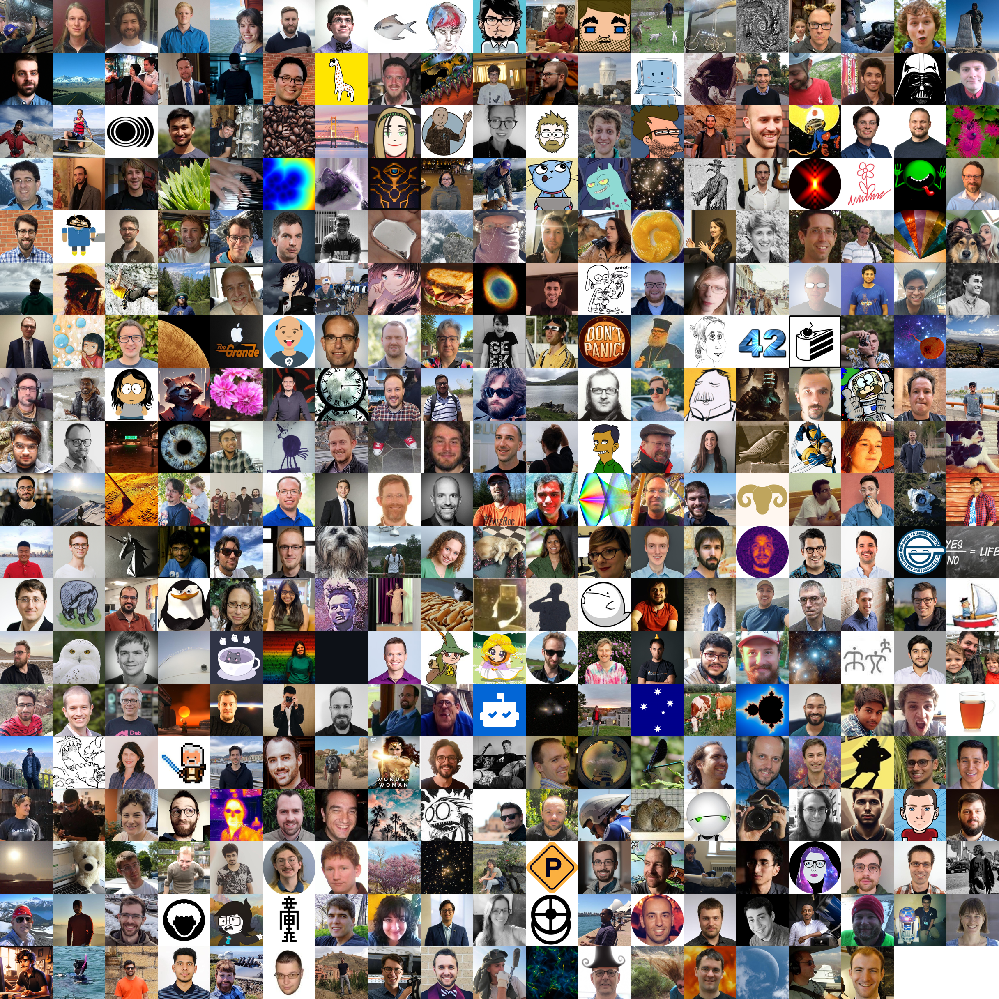

In [92]:
mosaic = Image.new(mode='RGBA', size=(image_size, image_size))
for i, a in enumerate(resized_avatars):
    x = (i%n_per_side)*cutout_size
    y = int(i/n_per_side)*cutout_size
    mosaic.paste(a, (x, y))
mosaic

In [94]:
mosaic.save('mosaic.png')